In [183]:
import SimRunner as sr
from infoenginessims.simprocedures import basic_simprocedures as sp
import kyle_tools as kt
%load_ext jupyternotify
#this class hides many details. to see everything that is happening you must study the SimRunner.py file 
# as well as sus.kyle_tools.multisim
fgr = sr.FredkinRunner()

The jupyternotify extension is already loaded. To reload it, use:
  %reload_ext jupyternotify


In [184]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams["animation.html"] = "jshtml"

from IPython.display import HTML
import matplotlib.animation as animation
%matplotlib inline

import importlib
import kyle_tools.heplerFunctionBitFlip as heplerFunctionBitFlip
heplerFunctionBitFlip = importlib.reload(heplerFunctionBitFlip)

In [185]:
#setting up parameters
# try to create a ParamGuider class from source.kyle_tools.multisim OR make your own similar class in order to 
# 'optimize' this bit flip. By optimize, I mean to find a protocol that has low work but also high fidelity.  
# Keep lambda at .5 but feel free to change the other parameters.

p_vals={}
p_vals['lambda']=0.5
p_vals['N'] = 10_000
p_vals['dt'] = 1/1000
p_vals['k'] = np.pi**2
p_vals['tau'] = 1
p_vals['depth'] = 1
p_vals['location'] = 1
p_vals['noise'] = True
p_vals['shift'] = 0

fgr.change_params(p_vals) # this is a method in SimManager, defined in multisim


In [186]:
fgr.run_sim() # defined in kyle_tools/multism.py


 initializing...
 found 10001 samples out of 10000
The as_tep is 2
The dt is 0.001
This line is for the initializatoin of the simulation object.
<bound method RKDetermEulerStoch.update_state of <integrators.rkdeterm_eulerstoch.RKDetermEulerStoch object at 0x7fbbb00225b0>> [<infoenginessims.simprocedures.basic_simprocedures.ReturnFinalState object at 0x7fb969b2c7f0>, <infoenginessims.simprocedures.basic_simprocedures.TerminateOnMean object at 0x7fb969b2c760>, <infoenginessims.simprocedures.basic_simprocedures.MeasureAllState object at 0x7fb903fe1670>, <infoenginessims.simprocedures.trajectory_measurements.CountJumps object at 0x7fb903bd4130>] 1000 0.001

 running sim...
901 1000
902 1000
903 1000
904 1000
905 1000
906 1000
907 1000
908 1000
909 1000
910 1000
911 1000
912 1000
913 1000
914 1000
915 1000
916 1000
917 1000
918 1000
919 1000
920 1000
921 1000
922 1000
923 1000
924 1000
925 1000
926 1000
927 1000
928 1000
929 1000
930 1000
931 1000
932 1000
933 1000
934 1000
935 1000
936 10

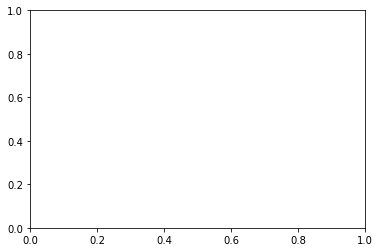

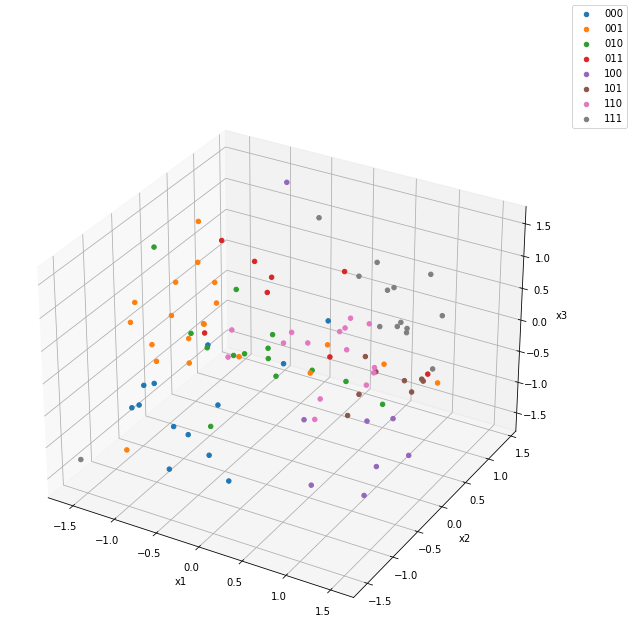

In [191]:
from kyle_tools.visualization import animate_sim_old
import kyle_tools as kt
all_state = fgr.sim.output.all_state["states"]

ani,_,_ = animate_sim_old(all_state[::100,:,:,0], 1, 
                frame_skip=10, color_by_state=True)
HTML(ani.to_jshtml(fps=30))

[[0.73241854 0.026984   0.12012965]
 [0.68448239 0.51615085 0.93341103]
 [0.87939255 0.84307407 0.76402176]
 [0.06824117 0.17016708 0.94317159]
 [0.81092269 0.84745732 0.61633343]
 [0.39221575 0.25481395 0.56748795]
 [0.49595375 0.09327055 0.51573976]
 [0.47781187 0.54644077 0.19711722]
 [0.64552932 0.49625293 0.3316387 ]
 [0.46423931 0.06781418 0.79370493]]
[0.73241854 0.68448239 0.87939255 0.06824117 0.81092269 0.39221575
 0.49595375 0.47781187 0.64552932 0.46423931]
[0.026984   0.51615085 0.84307407 0.17016708 0.84745732 0.25481395
 0.09327055 0.54644077 0.49625293 0.06781418]
[0.12012965 0.93341103 0.76402176 0.94317159 0.61633343 0.56748795
 0.51573976 0.19711722 0.3316387  0.79370493]
[[0.10460516 0.8017472  0.41409197]
 [0.51647089 0.32122139 0.03260975]
 [0.37606111 0.2927524  0.1077335 ]
 [0.18560834 0.4602513  0.33159538]
 [0.74537218 0.97652971 0.49927095]
 [0.20080541 0.37574771 0.74121914]
 [0.66834925 0.00839818 0.86819127]
 [0.05442662 0.62487507 0.38419988]
 [0.7116974 

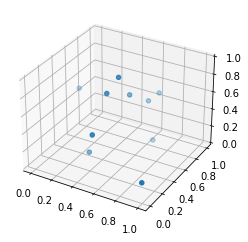

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

def generate_data():
    for i in range(10):
        data = np.random.rand(10, 3)
        yield data

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter([], [], [])

def update(frame):
    data = frame
    scatter._offsets3d = data[:, 0], data[:, 1], data[:, 2]
    print("=" * 10)
    print(data)
    print(data[:, 0])
    print(data[:, 1])
    print(data[:, 2])
#     print(frame.shape)
#     print(data)
    return scatter,

ani = FuncAnimation(fig, update, frames=generate_data, blit=True)

ani.save('animation.mp4', writer='ffmpeg')
plt.show()


In [181]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

def generate_data():
    for i in fgr.sim.output.all_state["step_indices"][::10]:
        data = fgr.sim.output.all_state["states"][::200, i, :, 0]
        yield data

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter([], [], [])

def update(frame):
    ax_range = [-2, 2]
    data = frame
    scatter._offsets3d = data[:, 0], data[:, 1], data[:, 2]
    ax.set_xlim(ax_range)
    ax.set_ylim(ax_range)
    ax.set_zlim(ax_range)
    return scatter

ani = FuncAnimation(fig, func = update, frames=generate_data)
ani.save('animation.mp4', writer='ffmpeg')

from IPython.display import HTML, Video
HTML("<video width='640' height='480' controls><source src='animation.mp4' type='video/mp4'></video>")
plt.close()


In [182]:
from IPython.display import HTML, Video
HTML("<video width='640' height='480' controls><source src='animation.mp4' type='video/mp4'></video>")
plt.close()

In [65]:
x_range = np.linspace(-1.5, 1.5, 1000)
comp_potential_parameters = bfr.system.potential.default_params
comp_potential = 1/2 * comp_potential_parameters[1] * x_range**2

store_potential_parameters = bfr.eq_system.potential.default_params
print(comp_potential_parameters)

[0, 9.869604401089358]


In [86]:
heplerFunctionBitFlip = importlib.reload(heplerFunctionBitFlip)
energy_time_series = heplerFunctionBitFlip.get_energy_time_series(fgr, all_state)
number_of_particles = fgr.sim.ntrials

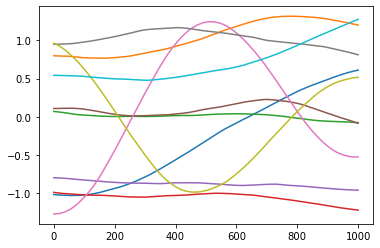

In [91]:
for x in range(number_of_particles)[::1000]:
    plt.plot(all_state[x, :, 1, 0])

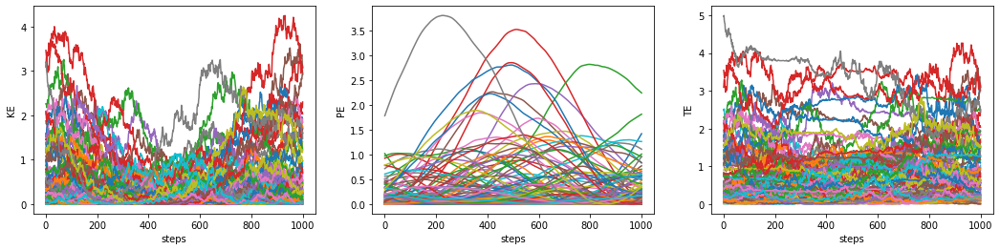

In [68]:
fig, ax = plt.subplots(1, 3, figsize=(18,4))

steps = 100

ax[0].set_xlabel("steps")
ax[0].set_ylabel("KE")   
for x in range(number_of_particles)[0::steps]:
    ax[0].plot(energy_time_series[x, :, :, 0])

ax[1].set_xlabel("steps")
ax[1].set_ylabel("PE")   
for x in range(number_of_particles)[0::steps]:
    ax[1].plot(energy_time_series[x, :, :, 1]) # PE graph

ax[2].set_xlabel("steps")
ax[2].set_ylabel("TE")   
for x in range(number_of_particles)[0::steps]:
    ax[2].plot(energy_time_series[x, :, :, 2]) # TE graph

plt.show()

# verification of the precision of the simulation for dt = 1/1_000
- In the following section, I will assess the accuracy of the simulation's position with dt = 1/1_000. 
- The precision of the work done is heavily dependent on the accuracy of the position, as the evaluation of work done involves comparing the potential energy before and after the protocol.

## (a) position evaluation (compare with the analytic solution)

The solution of a damped oscillator is 
$$x(t) = C_1 exp(-\alpha t) cos(\gamma t) + C_2 exp(-\alpha t) sin(\Omega t)$$
$$v(t) = exp(-\alpha t) [(C_1 \alpha + C_2 \Omega) cos(\Omega t) - (C_1 \Omega + C_2 \alpha) sin(\Omega t)]$$
$$\alpha = \lambda/2, \Omega = \sqrt{k - \alpha^2}$$
$$C_1 = x_0, C_2 = \frac{v_0 + x_0 \alpha}{\Omega}$$

## conclusion:
- We find that the max error in the position is about 1e-2

In [376]:
# set up parameters and time
alpha = sweepObject["lambda"]/2
omega_1 = np.sqrt(sweepObject["k"] - alpha**2)
t = np.pi / np.sqrt(sweepObject["k"])

In [377]:
# get the final_state and analytic_final_state
initial_state = bfr.sim.initial_state
final_state = bfr.sim.output.final_state

# calculate the analytical final states
analytic_final_state = final_state.copy()

C_1 = initial_state[:, :, 0]
C_2 = (initial_state[:, :, 1] + initial_state[:, :, 0] * alpha)/omega_1
analytic_final_state[:, :, 0] = np.exp(-alpha * t) * (C_1 * np.cos(omega_1 * t) + C_2 * np.sin(omega_1 * t))
analytic_final_state[:, :, 1] = np.exp(-alpha * t) * ((C_1 * -alpha + C_2 * omega_1) * np.cos(omega_1 * t) - \
                                                      (C_1 * omega_1 + C_2 * alpha) * np.sin(omega_1 * t))

In [378]:
position_error = analytic_final_state[:, :, 0] - final_state[:, :, 0]
velocity_error = analytic_final_state[:, :, 1] - final_state[:, :, 1]

In [379]:
# the maximum error of the position
print(max(np.abs(position_error)), max(np.abs(velocity_error)))


[1.48769885e-14] [3.64153152e-14]


In [380]:
len(bfr.sim.output.final_W)

10000

# (b) work done evaluation
- In this section, I want to compare the result of the work done calculated from the simulation and the analytic solution.

conclusion:
- The difference in mean work done are small

In [96]:
final_W = fgr.sim.output.final_W

# work done from analytic solution
U0 = fgr.system.get_potential(initial_state, 0) - fgr.eq_system.get_potential(analytic_final_state, 0)
UF = fgr.eq_system.get_potential(final_state, 0) - fgr.system.get_potential(analytic_final_state, 0)
analytical_final_W = U0 + UF

print("The mean work done of the simulation result is:", np.mean(final_W))
print("The mean work done of the analytical result is:", np.mean(analytical_final_W))

NameError: name 'analytic_final_state' is not defined

# (c) Flip evaluation

In this section, I use the initial and final states to evaluate the fidelity rate of the system. 

## conclusion:
- I found that the fidelity rate is high.
- The bad bits are the one with small initial position.  

In [382]:
initial_bit_value = np.sign(initial_state[:,:,0])
final_bit_value = np.sign(final_state[:, :, 0])

# to get the index of good bits and bad bits
fidelity_index = (initial_bit_value != final_bit_value)
infidelity_index = (initial_bit_value == final_bit_value)

In [383]:
fidelity_rate = np.sum(fidelity_index) / len(initial_bit_value) * 100
print("The fidelity rate is ", fidelity_rate) 

The fidelity rate is  99.97


# (d) checking fluctuation theorem

- The Jarzynski equation is ⟨exp(−βW)⟩ = exp(−βΔF)
- ∆F = 0 as the initial potential and final potentials are the same and thus the parition functions are the same.
- truncate the array to make the jarzynski term equals to one.

In [192]:
def truncateFinalW(final_W):
    sorted_final_W = np.sort(final_W)
    naive_jarzynski = np.mean(np.exp(-np.sort(final_W)))
    truncated_jarzynski = 0.0
    truncated_part = [0.0]

    if naive_jarzynski > 1:
        for x in range(0, len(final_W)):
            truncated_jarzynski = np.mean(np.exp(-np.sort(final_W)[x:]))
            truncated_jarzynski_next = np.mean(np.exp(-np.sort(final_W)[x+1:]))
            truncated_part = sorted_final_W[:x+1]
            remaining_part = sorted_final_W[x+1:]
            if truncated_jarzynski_next < 1 and truncated_jarzynski > 1:
                break
    else:
        for x in range(0, len(final_W)):
            truncated_jarzynski = np.mean(np.exp(-np.sort(final_W)[:-x]))
            truncated_jarzynski_next = np.mean(np.exp(-np.sort(final_W)[:-x-1]))
            truncated_part = sorted_final_W[-x-1:]
            remaining_part = sorted_final_W[:-x-1]            
            if truncated_jarzynski_next > 1 and truncated_jarzynski < 1:
                break
                
    return truncated_jarzynski, truncated_jarzynski_next, truncated_part, remaining_part
        

final_W = fgr.sim.output.final_W
naive_jarzynski = np.mean(np.exp(-np.sort(final_W)[35:]))
truncated_jarzynski, truncated_jarzynski_next, truncated_part, remaining_part = truncateFinalW(final_W)
print(naive_jarzynski)
print("truncated_jarzynski = ", truncated_jarzynski)
print("truncated_jarzynski_next = ", truncated_jarzynski_next)

48913717827.92417
truncated_jarzynski =  1.0044691151526313
truncated_jarzynski_next =  0.9970499778424468


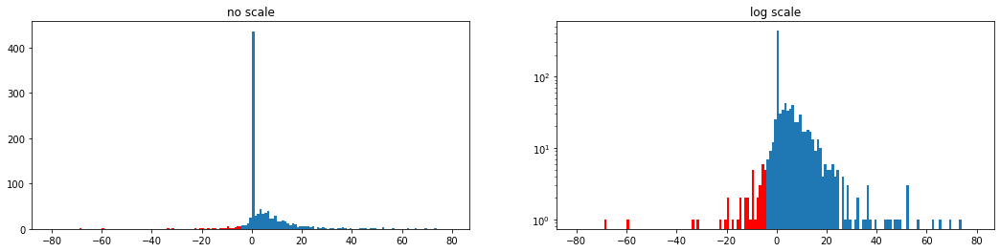

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

selfDefinedBins = range(-80, 80, 1)
ax[0].hist(remaining_part, bins = selfDefinedBins)
ax[0].hist(truncated_part, bins = selfDefinedBins, color = "red")
ax[0].title.set_text('no scale')

ax[1].set_yscale("log")
ax[1].hist(remaining_part, bins = selfDefinedBins)
ax[1].hist(truncated_part, bins = selfDefinedBins, color = "red")
ax[1].title.set_text('log scale')

plt.show()

In [366]:
def get_analytical_final_state(initial_state):
    # this function is for underdamped situation
    analytic_final_state = initial_state.copy()
    C_1 = initial_state[:, :, 0]
    C_2 = (initial_state[:, :, 1] + initial_state[:, :, 0] * alpha)/omega_1
    analytic_final_state[:, :, 0] = np.exp(-alpha * t) * (C_1 * np.cos(omega_1 * t) + C_2 * np.sin(omega_1 * t))
    analytic_final_state[:, :, 1] = np.exp(-alpha * t) * ((C_1 * -alpha + C_2 * omega_1) * np.cos(omega_1 * t) - \
                                                          (C_1 * omega_1 + C_2 * alpha) * np.sin(omega_1 * t))
    return analytic_final_state

# (d) check_state_EPT

According to the general equipartition theorem, under equilibirum state, we have this result.
$$\left\langle x_{m}{\frac{\partial H}{\partial x_{n}}}\right\rangle=\delta_{m n}k_{\mathrm{B}}T$$
- In the following function, we have an array of matrices of 10,000 particles which are
$$q\frac{\partial H}{\partial q}, q\frac{\partial H}{\partial p}, p\frac{\partial H}{\partial q}, p\frac{\partial H}{\partial p}$$
- The ensemble average of the diagonal terms should be equal to 1 in thermal eqm.
- The ensemble average of the non-diagonal terms should be equal to 0 in thermal eqm.

In the first part, I checked the EPT in V_storage (i.e at t_i and t_f under V_storage). In the second part, I checked the EPT during in V_comp (i.e. from t_i to t_f under V_comp)

In [83]:
def check_state_EPT(_state, eq_state = True):
    if eq_state:
        get_force = fgr.eq_system.get_external_force
    else:
        get_force = fgr.system.get_external_force

    indexArray = []
    for i in range(6):
        for j in range(6):
            indexArray.append([i, j])

    X = np.append(_state[...,0], fgr.system.mass * _state[...,1], axis=1)
    d_H = np.append( -get_force(_state, 0), _state[...,1], axis=1)
    prod = np.einsum('in,im->inm', X, d_H)
    
    prod_dict = {}
    for index in indexArray:
        str_index = map(lambda x: str(x), index)
        prod_dict["".join(str_index)] = np.mean(prod[:, index[0], index[1]])
    return prod_dict

### (d.1) EPT in V_storage (i.e at t_i and t_f under V_storage)

In [84]:
initial_state = fgr.sim.initial_state
final_state = fgr.sim.output.final_state

initial_EPT_matrix = check_state_EPT(initial_state, True)
final_EPT_matrix = check_state_EPT(final_state, True)

print("The corresponding mean of the EPT matrix is: ")


diag_index = [[0, 0], [1, 1], [2, 2], [3, 3], [4, 4], [5, 5]]
non_diag_index = [item for item in indexArray if item not in diag_index]


print("intial_states")
for index in diag_index:
    str_index = "".join(map(lambda x: str(x), index))
    print(f"\t diagonal Terms: prod_{str_index} = {initial_EPT_matrix[str_index]}")

for index in non_diag_index:
    str_index = "".join(map(lambda x: str(x), index))
    print(f"\t non_diagonal Terms: prod_{str_index} = {initial_EPT_matrix[str_index]}")
#     print(f"\t non-diagonal Terms: prod_01 = {initial_EPT_matrix[1]}, prod_10 = {initial_EPT_matrix[2]}")

print("final_states")
for index in diag_index:
    str_index = "".join(map(lambda x: str(x), index))
    print(f"\t diagonal Terms: prod_{str_index} = {final_EPT_matrix[str_index]}")

for index in non_diag_index:
    str_index = "".join(map(lambda x: str(x), index))
    print(f"\t non_diagonal Terms: prod_{str_index} = {final_EPT_matrix[str_index]}")


The corresponding mean of the EPT matrix is: 
intial_states
	 diagonal Terms: prod_00 = 1.016198690840572
	 diagonal Terms: prod_11 = 0.9742686155242978
	 diagonal Terms: prod_22 = 0.956407710793695
	 diagonal Terms: prod_33 = 0.9903753642821604
	 diagonal Terms: prod_44 = 0.9977530900419078
	 diagonal Terms: prod_55 = 1.003041128334924
	 non_diagonal Terms: prod_01 = 0.014860367091053808
	 non_diagonal Terms: prod_02 = -0.0046901743456714586
	 non_diagonal Terms: prod_03 = -0.0013346027349287013
	 non_diagonal Terms: prod_04 = -0.005152030073084908
	 non_diagonal Terms: prod_05 = -0.008085722246222341
	 non_diagonal Terms: prod_10 = -0.029729622523442124
	 non_diagonal Terms: prod_12 = -0.016916017114575816
	 non_diagonal Terms: prod_13 = 0.0031642487695151436
	 non_diagonal Terms: prod_14 = 0.011561472993054543
	 non_diagonal Terms: prod_15 = 0.005596554722186872
	 non_diagonal Terms: prod_20 = -0.029347957389671886
	 non_diagonal Terms: prod_21 = 0.020711774396697063
	 non_diagonal 

### (d.2) EPT during in V_comp (i.e. from t_i to t_f under V_comp)

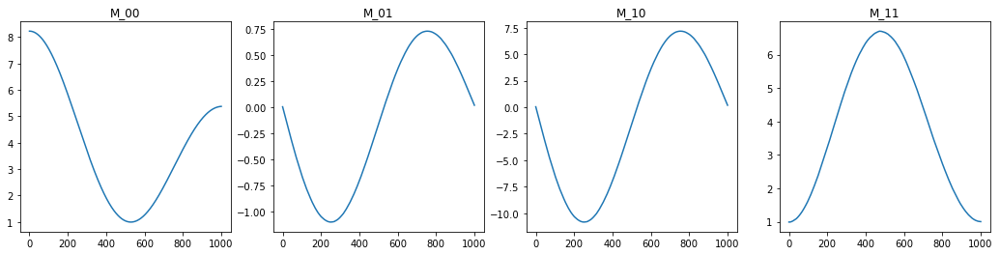

In [104]:
all_states = bfr.sim.output.all_state
EPT_matrix_time_series = []
for x in all_states["step_indices"]:
    EPT_matrix_time_series.append(check_state_EPT(all_states["states"][:, x, :, :], False))
EPT_matrix_time_series = np.array(EPT_matrix_time_series)

fig, ax = plt.subplots(1, 4, figsize=(18,4))
title_array = ["00", "01", "10", "11"]

for i in range(0, 4):
    ax[i].plot(EPT_matrix_time_series[:, i])
    ax[i].title.set_text(f'M_{title_array[i]}')

In [334]:
dt_list[3]

5e-05

In [335]:
# 0: dt = , 1: mean_work_done, 2: fluctuation, 3: jarzynski_term, 4: delta)
_filter = True
_deltaList = np.linspace(0.01, 4, 100)
_dt = dt_list[3]
print(_dt)
workDoneDataArray = np.asarray([createWorkDoneList(_dt, _filter = True, _delta = _d) \
                                for _d in _deltaList])

# print("0: dt, 1L mean_work_done, 2: fluctuation, 3: jarzynski_term, 4: delta")
# workDoneDataArray

5e-05


In [340]:
workDoneDataArray

array([[5.00000000e-05, 1.61168624e+00, 2.40255999e-01, 1.99298941e-01,
        1.00000000e-02],
       [5.00000000e-05, 1.61168624e+00, 9.84494062e-02, 1.99860405e-01,
        5.03030303e-02],
       [5.00000000e-05, 1.61168624e+00, 6.89738037e-02, 1.99638141e-01,
        9.06060606e-02],
       [5.00000000e-05, 1.61168624e+00, 5.71247042e-02, 1.99608266e-01,
        1.30909091e-01],
       [5.00000000e-05, 1.61168624e+00, 5.02671127e-02, 1.99863242e-01,
        1.71212121e-01],
       [5.00000000e-05, 1.61168624e+00, 4.46829512e-02, 2.00142356e-01,
        2.11515152e-01],
       [5.00000000e-05, 1.61168624e+00, 4.13252882e-02, 1.99708310e-01,
        2.51818182e-01],
       [5.00000000e-05, 1.61168624e+00, 3.83300484e-02, 2.00482792e-01,
        2.92121212e-01],
       [5.00000000e-05, 1.61168624e+00, 3.61016331e-02, 2.00499074e-01,
        3.32424242e-01],
       [5.00000000e-05, 1.61168624e+00, 3.39697813e-02, 1.99782027e-01,
        3.72727273e-01],
       [5.00000000e-05, 1.6116

mean work done = 1.6116862399818686


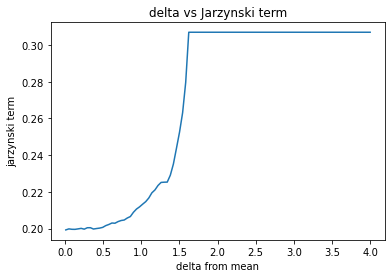

In [346]:
print(f"mean work done = {workDoneDataArray[0][1]}")

plt.title("delta vs Jarzynski term")
plt.xlabel("delta from mean")
plt.ylabel("jarzynski term")
plt.plot(workDoneDataArray[:, -1], np.abs(workDoneDataArray[:, -2]))

# dt_sweep

In [11]:
sweepObject = {
    "lambda":   0.5,
    "N":        10_000,
    #"dt":       [1/1_000, 1/5_000, 1/10_000, 1/50_000, 1/100_000],
    "dt":       [1/500_000, 1/1_000_000],
    "k":        np.pi**2,
    "tau":      1,
    "depth":    1,
    "location": 1
}

parameter = "dt"
label = "dt_sweep"
heplerFunctionBitFlip.sweepFunction(sweepObject, bfr, label, save = True)

========== start (1/2) ==========
lambda_0.5_N_10000_dt_2e-06_k_9.8696_tau_1_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10033 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 1.591656192260792
========== finished (1/2) ==========
========== start (2/2) ==========
lambda_0.5_N_10000_dt_1e-06_k_9.8696_tau_1_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10032 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 1.5905063331950529
========== finished (2/2) ==========


dt_sweep
[0.001, 0.0002, 0.0001, 2e-05, 1e-05]
[100.0, 100.0, 100.0, 100.0, 100.0]
[1.584647149660738, 1.5871545752225018, 1.587769756067623, 1.6011414678097349, 1.5957725540261338]


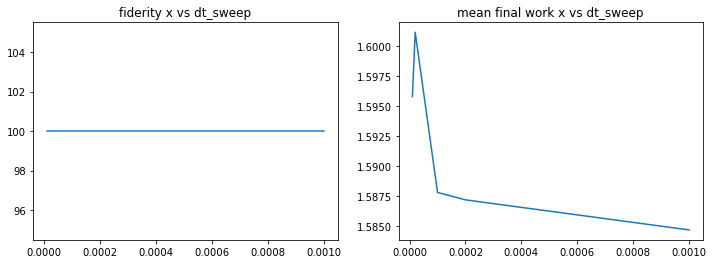

In [10]:
heplerFunctionBitFlip.sweepAnalysisFunction(parameter, label)

# k_sweep

In [69]:
sweepObject = {
    "lambda":   0.5,
    "N":        10_000,
    "dt":       1/10_000,
    "k":        np.linspace(1, 10, 9),
    "tau":      1,
    "depth":    1,
    "location": 1
    
}

parameter = "k"
label = "k_sweep"
heplerFunctionBitFlip.sweepFunction(sweepObject, bfr, label, save = True)

========== start (1/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_1_tau_1_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (1.0, 1.0)]
 found 10027 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 98.5
meanFinalWork = 0.6257530770394865
========== finished (1/9) ==========
========== start (2/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_2.125_tau_1_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (2.125, 2.125)]
 found 10005 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 99.5
meanFinalWork = 0.7337714366442192
========== finished (2/9) ==========
========== start (3/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_3.25_tau_1_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (3.25, 3.25)]
 found 10037 samples out of 10000
 running sim...

 analyzing output...
fidelity_

k_sweep
[1.0, 2.125, 3.25, 4.375, 5.5, 6.625, 7.75, 8.875, 10.0]
[97.5, 98.0, 100.0, 100.0, 100.0, 100.0, 100.0, 99.5, 100.0]
[0.6272282846859902, 0.7418414670983989, 0.8666131175600654, 1.0064612608399899, 1.133294605209016, 1.2648888957755036, 1.376149516415272, 1.5003021265708154, 1.605604248504988]


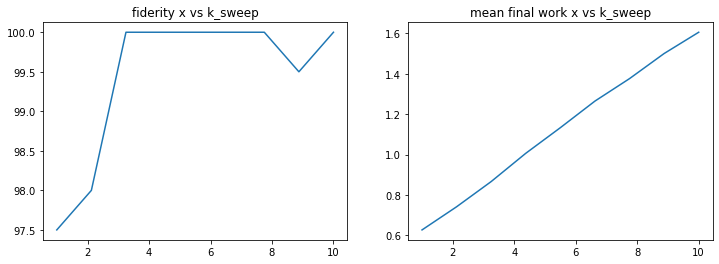

In [68]:
heplerFunctionBitFlip.sweepAnalysisFunction(parameter, label)

# tau_sweep

In [72]:
sweepObject = {
    "lambda":   0.5,
    "N":        10_000,
    "dt":       1/10_000,
    "k":        np.pi**2,
    "tau":      np.linspace(0.5, 5, 8),
    "depth":    1,
    "location": 1
}

# how long the protocol, relation between tau and k

parameter = "tau"
label = "tau_sweep"
heplerFunctionBitFlip.sweepFunction(sweepObject, bfr, label, save = True)

========== start (1/8) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_0.5_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10015 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 1.6101772705455206
========== finished (1/8) ==========
========== start (2/8) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1.1429_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10054 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 1.591708286806516
========== finished (2/8) ==========
========== start (3/8) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1.7857_depth_1_location_1

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.

tau_sweep
[0.5, 1.1428571428571428, 1.7857142857142858, 2.428571428571429, 3.0714285714285716, 3.7142857142857144, 4.357142857142858, 5.0]
[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[1.6101772705455206, 1.591708286806516, 1.588608025018252, 1.5836997118860727, 1.6059757771146148, 1.5851443348030336, 1.5964280268061113, 1.5817001545714713]


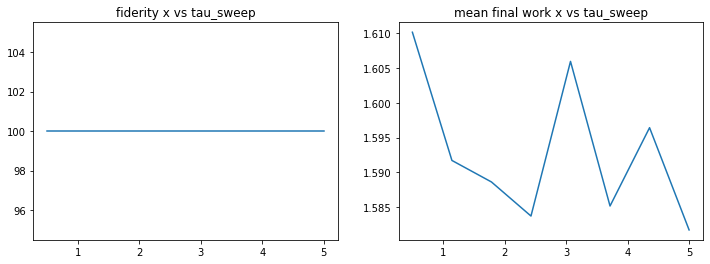

In [73]:
heplerFunctionBitFlip.sweepAnalysisFunction(parameter, label)

# depth sweep

In [74]:
heplerFunctionBitFlip = importlib.reload(heplerFunctionBitFlip)

sweepObject = {
    "lambda":   0.5,
    "N":        10_000,
    "dt":       1/10_000,
    "k":        np.pi**2,
    "tau":      1,
    "depth":    np.linspace(1, 4, 9),
    "location": 1
    
}

label = "depth_sweep"
heplerFunctionBitFlip.sweepFunction(sweepObject, bfr, label, save = True)

========== start (1/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1_depth_1_location_1
- This set of parameter is already simulated.
- Nothing is saved.
- Skip to the next paramter.

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10038 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 1.5865613504873617
========== finished (1/9) ==========
========== start (2/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1_depth_1.375_location_1

 initializing...
the parameters:  [(1.375, 1.375), (-5.5, -5.5)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10024 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 1.64353492143105
========== finished (2/9) ==========
========== start (3/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1_depth_1.75_location_1

 initializing...

depth_sweep
[1.0, 1.375, 1.75, 2.125, 2.5, 2.875, 3.25, 3.625, 4.0]
[100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[1.5865613504873617, 1.64353492143105, 1.7132574941446614, 1.7929137924154093, 1.883721828964067, 1.956253088450803, 2.0408294526562636, 2.1200584370422066, 2.192951972771929]


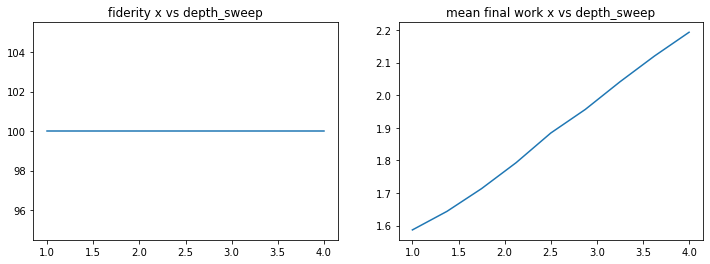

In [75]:
parameter = "depth"
label = "depth_sweep"

heplerFunctionBitFlip.sweepAnalysisFunction(parameter, label)

# location sweep

In [76]:
heplerFunctionBitFlip = importlib.reload(heplerFunctionBitFlip)

sweepObject = {
    "lambda":   0.5,
    "N":        10_000,
    "dt":       1/10_000,
    "k":        np.pi**2,
    "tau":      1,
    "depth":    1,
    "location": np.linspace(1, 3, 9)
    
}

parameter = "location"
label = "location_sweep"
heplerFunctionBitFlip.sweepFunction(sweepObject, bfr, label, save = True)

========== start (1/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1_depth_1_location_1
- This set of parameter is already simulated.
- Nothing is saved.
- Skip to the next paramter.

 initializing...
the parameters:  [(1.0, 1.0), (-4.0, -4.0)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10010 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 99.5
meanFinalWork = 1.594692948896861
========== finished (1/9) ==========
========== start (2/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1_depth_1_location_1.25

 initializing...
the parameters:  [(0.4096, 0.4096), (-2.56, -2.56)]
the parameters:  [(0, 0), (9.869604401089358, 9.869604401089358)]
 found 10081 samples out of 10000
 running sim...

 analyzing output...
fidelity_rate = 100.0
meanFinalWork = 2.477828607728142
========== finished (2/9) ==========
========== start (3/9) ==========
lambda_0.5_N_10000_dt_0.0001_k_9.8696_tau_1_depth_1_location_1.5

 initializing..

location_sweep
[1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0]
[99.5, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[1.594692948896861, 2.477828607728142, 3.2099632946331775, 3.5285106057306184, 3.5684419576044952, 3.5368292058904918, 3.41562711025522, 3.296387108470399, 3.22639861878555]


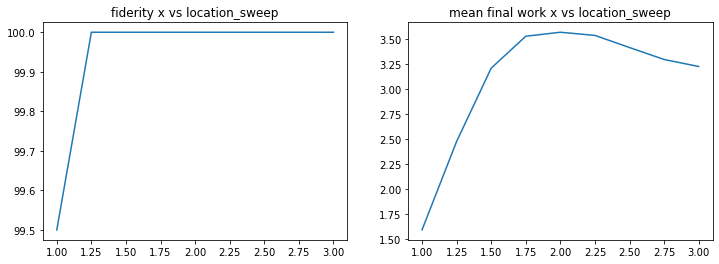

In [77]:
heplerFunctionBitFlip.sweepAnalysisFunction(parameter, label)

In [660]:
%%time
bfr.run_sim(verbose=True)


 initializing...
 found 5001 samples out of 5000
 running sim...

 analyzing output...
CPU times: user 549 ms, sys: 68.4 ms, total: 617 ms
Wall time: 708 ms


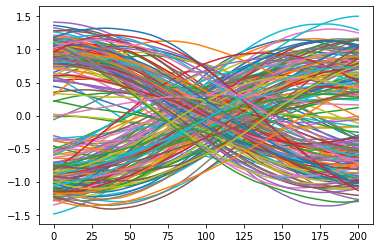

In [662]:
#here is a quick trajectory trace
allstate = bfr.sim.output.all_state['states']
plt.plot(allstate[:,:,0,0].transpose());

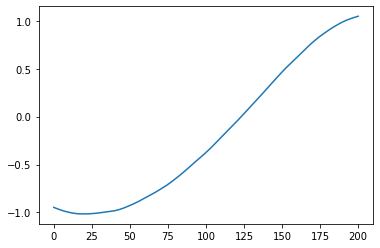

In [670]:
plt.plot(allstate[0,:,0,0]);

In [ ]:
def setup_sim(system, init_state, procedures=None, sim_params=None, dt=1/200, damping=1, temp=1, extra_time=1):
    print(f" system: {system},\n init_state: {init_state},\n procedures: {procedures},\n " +
          f"sim_params: {sim_params},\n dt: {dt},\n damping: {damping},\n" +
          f" temp: {temp},\n extra_time: {extra_time}")
    
sim_kwargs = {'damping': "damping",
          'temp': "T", 
          'dt':"dt", 
          'procedures':"proceudures",
          'sim_params': [1, 1, 0]
         }

setup_sim("system", "init_state", **sim_kwargs)

In [85]:
import numpy as np
import pandas as pd
from statsmodels.tsa.vector_ar.var_model import VAR

# generate some sample data
np.random.seed(123)
data = np.random.randn(100, 2)
df = pd.DataFrame(data, columns=['X', 'Y'])

# fit a VAR model to the data
model = VAR(df)
results = model.fit()

# test for Granger causality from X to Y
test_result = results.test_causality(['X'], ['Y'], kind='f')

# print the test result
print('Granger causality from X to Y:', test_result.pvalue)

Granger causality from X to Y: 0.8297989774089181


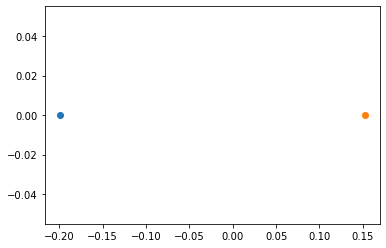

In [111]:
plt.scatter(bfr.sim.output.all_state["states"][1, 0, 0, 0], 0);
plt.scatter(bfr.sim.output.all_state["states"][1, -1, 0, 0], 0);


In [110]:
bfr.sim.output.all_state["states"][0, 0,...]

array([[1.40129021, 0.1007816 ]])

# testing for probability distribution

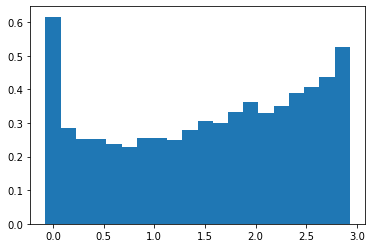

In [349]:
# Generate some random data

# Compute the histogram
hist, bins = np.histogram(bfr.sim.output.final_W, bins=20, density=False)

# Normalize the histogram to obtain a probability distribution
bin_widths = np.diff(bins)
probabilities = hist / (np.sum(hist) * bin_widths)

# Plot the probability distribution
plt.bar(bins[:-1], probabilities, width=bin_widths)

plt.show()

In [368]:
sim

NameError: name 'sim' is not defined

In [442]:
Y = np.random.normal(2, 10, 10)
print(Y)

[10.67865942 -3.53373134 12.79520484 -6.01217812 -2.44346863 13.749796
  2.09812298 -5.68272716  0.92219143  2.85018184]


In [443]:
X = np.linspace(0, len(Y)-1, len(Y), dtype = int)

In [454]:
index = np.r_[Y[:-1] < Y[1:]]

In [465]:
X[np.r_[Y[:-1] < Y[1:], False]]

array([1, 3, 4, 7, 8])

In [467]:
h = 6.63e-34
m = 32 * 1.67e-27
k_B = 1.38e-23
V = 10**-6

In [469]:
T = h**2 / (2*np.pi * m * k_B * V**(2/3))
print(T)

9.486404796380242e-16
